# The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle 

In [4]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob

%matplotlib inline

## Undistortion

In [12]:
TEST_BOARD = mpimg.imread('camera_cal/calibration1.jpg')
image_shape = TEST_BOARD.shape

In [13]:
nx = 9
ny = 6

objpoints = []
imgpoints = []

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

desk_images = glob.glob("camera_cal/calibration*.jpg")

for fname in desk_images:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        
# use the object and image points to caliberate the camera and compute the camera matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2],None,None)

In [14]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

Text(0.5, 1.0, 'Undistorted Image')

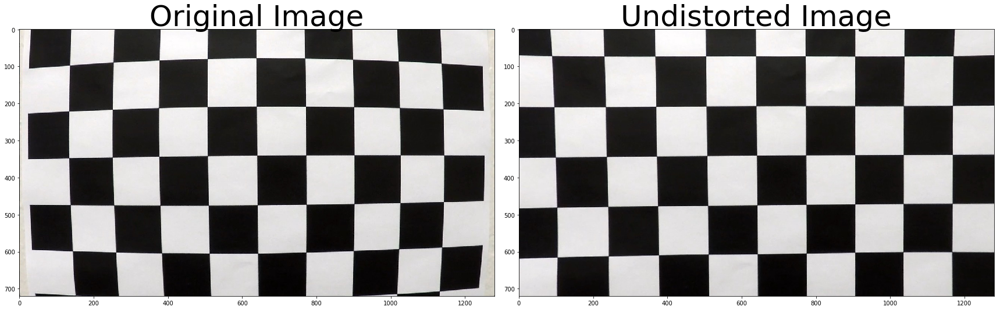

In [15]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_BOARD)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistort(TEST_BOARD, mtx, dist))
ax2.set_title('Undistorted Image', fontsize=50)

In [16]:
f.savefig('output_images/undistort.png')

In [156]:
TEST_CAR = cv2.imread('./test_images/test4.jpg')
TEST_CAR = cv2.cvtColor(TEST_CAR, cv2.COLOR_BGR2RGB)
TEST_CAR_UNDISORT = undistort(TEST_CAR, mtx, dist)
ALL_TEST_IMAGES = glob.glob('./test_images/*.jpg')

Text(0.5, 1.0, 'Undistorted Image')

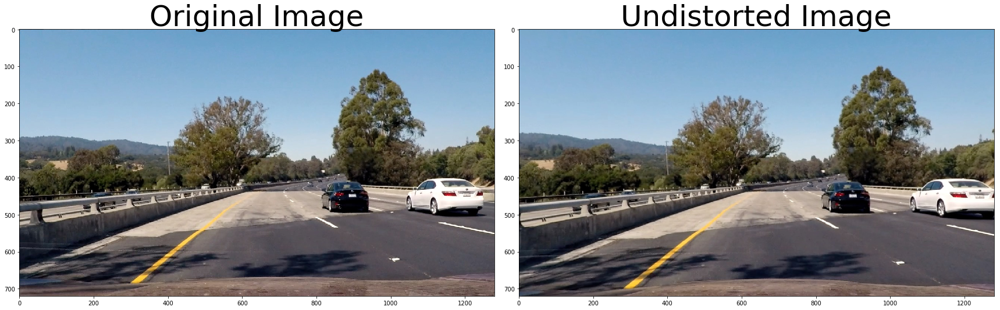

In [30]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistort(TEST_CAR, mtx, dist),)
ax2.set_title('Undistorted Image', fontsize=50)

## Perspective Transform

In [116]:
def unwarp(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    # Reverse it to get the top view perspective
    MINV = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, MINV

In [170]:
H, W = TEST_CAR_UNDISORT.shape[:2]

# define source and destination points for transform
SRC = np.float32([
    (585, 460),
    (203, 720 ), 
    (1127, 720), 
    (695, 460)]
)

DST = np.float32([
   (320, 0),
   (320, 720),
   (960, 720),
   (960, 0)]
)



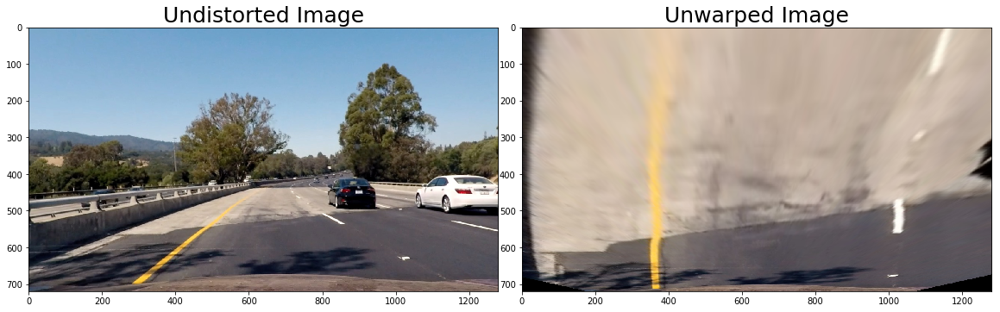

In [171]:
TEST_CAR_WARP, M, MINV = unwarp(TEST_CAR_UNDISORT, SRC, DST)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(TEST_CAR_UNDISORT)
ax1.set_title('Undistorted Image', fontsize=25)
ax2.imshow(TEST_CAR_WARP)
ax2.set_title('Unwarped Image', fontsize=25)
plt.imsave("output_images/unwarped.jpg", TEST_CAR_WARP)

## Gradient Threshold

In [172]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(25, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale === or LAB L channel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary

#### Example

Text(0.5, 1.0, 'Sobel Image')

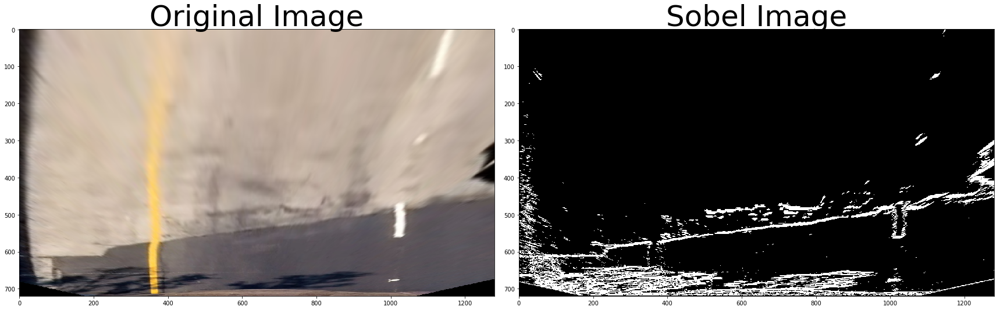

In [279]:
sobel_img_x = abs_sobel_thresh(TEST_CAR_WARP, sobel_kernel=3, orient='y', thresh=(8, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_img_x, cmap='gray')
ax2.set_title('Sobel Image', fontsize=50)

Text(0.5, 1.0, 'Sobel Image')

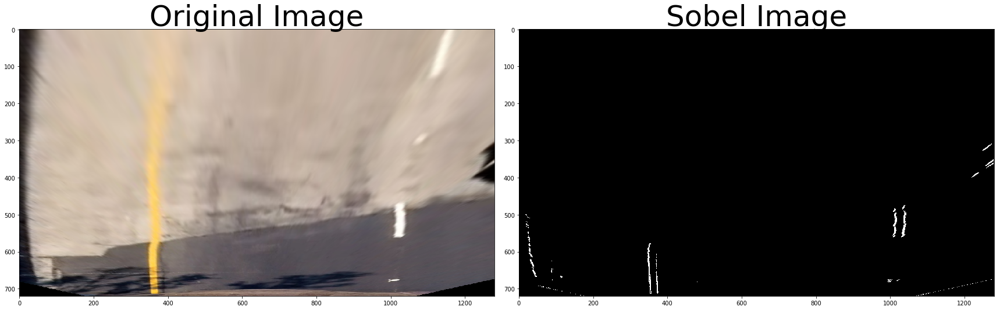

In [226]:
sobel_img_x = abs_sobel_thresh(TEST_CAR_WARP, orient='x', thresh=(80, 200))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_img_x, cmap='gray')
ax2.set_title('Sobel Image', fontsize=50)

In [186]:
def mag_thresh(img, sobel_kernel=3, thresh=(25, 255)):
    # Take both Sobel x and y gradients
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    # Return the binary image
    return binary_output

#### Example

Text(0.5, 1.0, 'Mag Image')

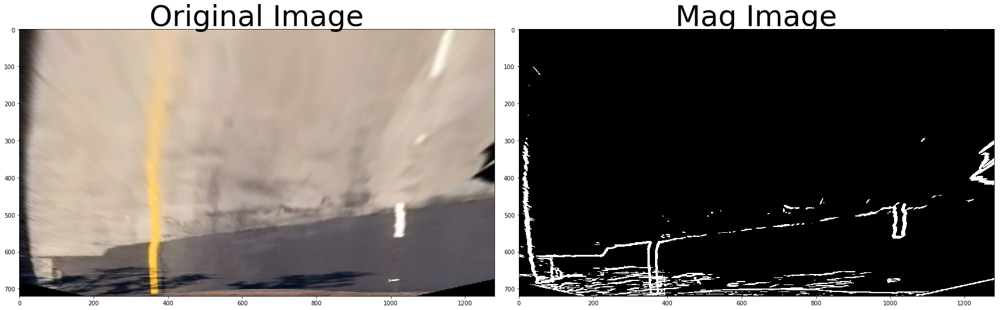

In [275]:
mag_img = mag_thresh(TEST_CAR_WARP, sobel_kernel=7, thresh=(30, 200))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_img, cmap='gray')
ax2.set_title('Mag Image', fontsize=50)

In [276]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, 0.01)):
    # Grayscale
    # Calculate the x and y gradients
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

Text(0.5, 1.0, 'DIR Image')

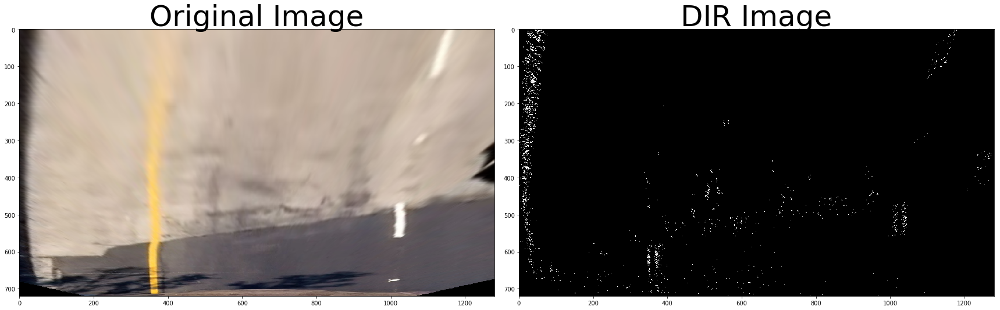

In [272]:
dir_img = dir_threshold(TEST_CAR_WARP, thresh=(0.01, 0.09))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_img, cmap='gray')
ax2.set_title('DIR Image', fontsize=50)

In [267]:
def gradient(image, ksize=7):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(15, 255))
    #grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, thresh=(30, 180))
    #dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, 0.09))
    combined = np.zeros_like(gradx)
    combined[((gradx == 1) | (mag_binary == 1))] = 1
    return combined

Text(0.5, 1.0, 'gradient Image')

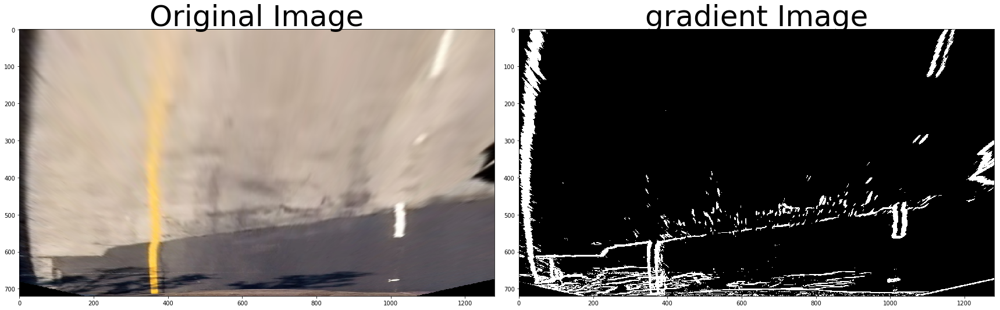

In [268]:
gradient_img = gradient(TEST_CAR_WARP)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gradient_img, cmap='gray')
ax2.set_title('gradient Image', fontsize=50)

## HLS Color Threshold

## HLS - S chanel

In [256]:
def hls_stresh(image, thresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    binary = np.zeros_like(S)

    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary
    

Text(0.5, 1.0, 'hls_s Image')

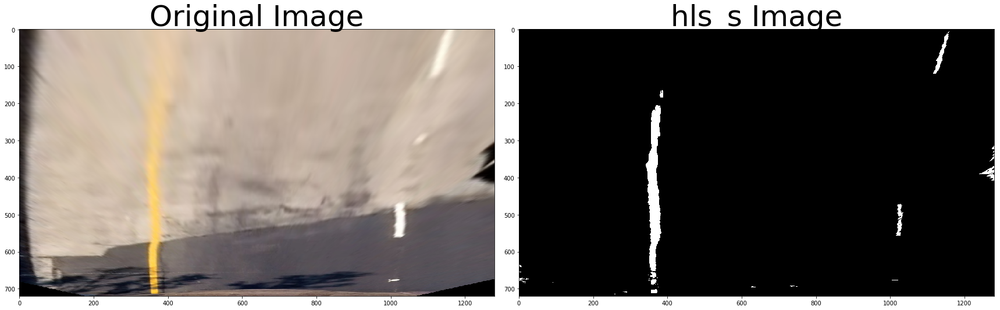

In [236]:
hls_s = hls_stresh(TEST_CAR_WARP, thresh=(180, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_s, cmap='gray')
ax2.set_title('hls_s Image', fontsize=50)

## HLS - L chanel

In [238]:
def hls_lthresh(img, thresh=(180, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

Text(0.5, 1.0, 'hls_l Image')

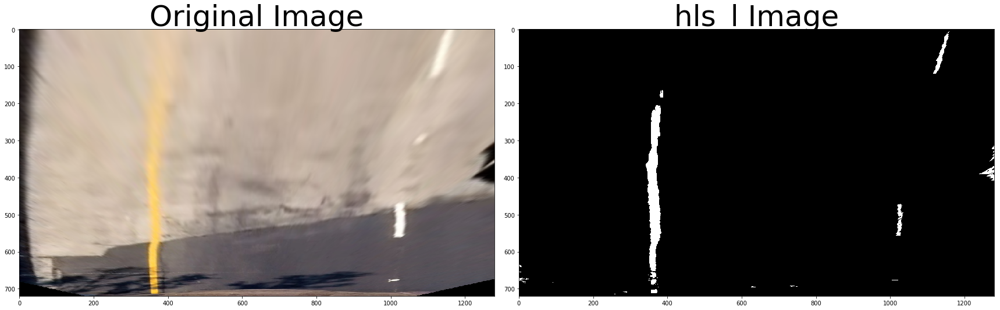

In [239]:
hls_l = hls_stresh(TEST_CAR_WARP, thresh=(180, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_l, cmap='gray')
ax2.set_title('hls_l Image', fontsize=50)

## RGB2Lab

In [287]:
def lab_thresh(img, thresh=(190,255)):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # Apply a threshold to the L channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # Return a binary image of threshold result
    return binary_output 

Text(0.5, 1.0, 'hls_l Image')

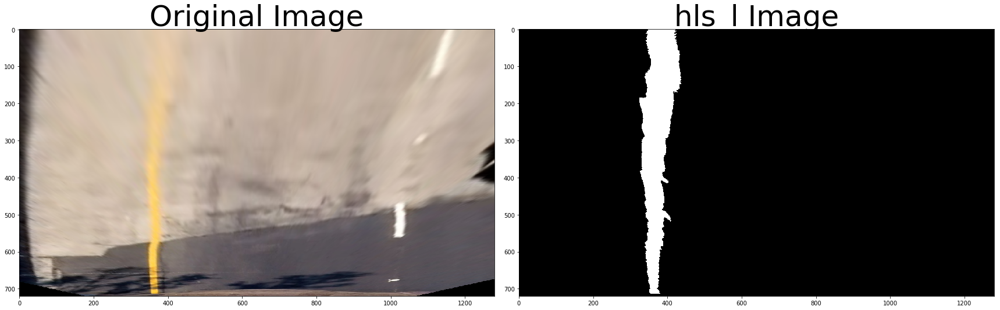

In [288]:
lab = lab_thresh(TEST_CAR_WARP, thresh=(180, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(lab, cmap='gray')
ax2.set_title('hls_l Image', fontsize=50)

## Image Processing Pipeline

In [295]:
# in my experiment gradient thresholds gies a bad result
def pipeline(img):
    # Undistort
    img_undistort = undistort(img, mtx, dist)
    
    # Perspective Transform
    img_unwarp, M, MINV = unwarp(img_undistort, SRC, DST)

    # HLS L-channel Threshold
    img_LThresh = hls_lthresh(img_unwarp, thresh=(220, 255))

    # Lab B-channel Threshold
    img_BThresh = lab_thresh(img_unwarp)
    
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    return combined, MINV

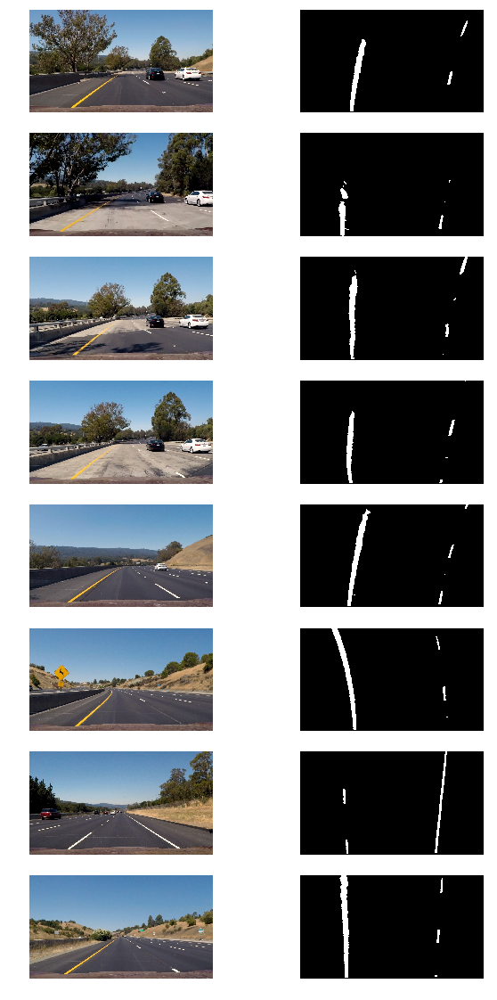

In [296]:
fig, axs = plt.subplots(len(ALL_TEST_IMAGES),2, figsize=(10, 20))

axs = axs.ravel()
                  
index = 0
for image in ALL_TEST_IMAGES:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_bin, _ = pipeline(img)
    axs[index].imshow(img)
    axs[index].axis('off')
    index += 1
    axs[index].imshow(img_bin, cmap='gray')
    axs[index].axis('off')
    index += 1

## Histogram

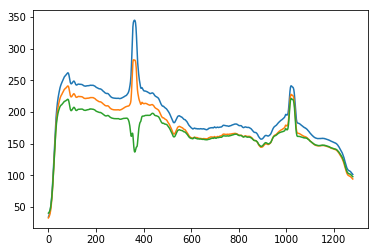

In [297]:
warped_img = TEST_CAR_WARP/255

def hist(img):
    # TO-DO: Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    
    return histogram

# Create histogram of image binary activations
histogram = hist(warped_img)

# Visualize the resulting histogram
plt.plot(histogram)

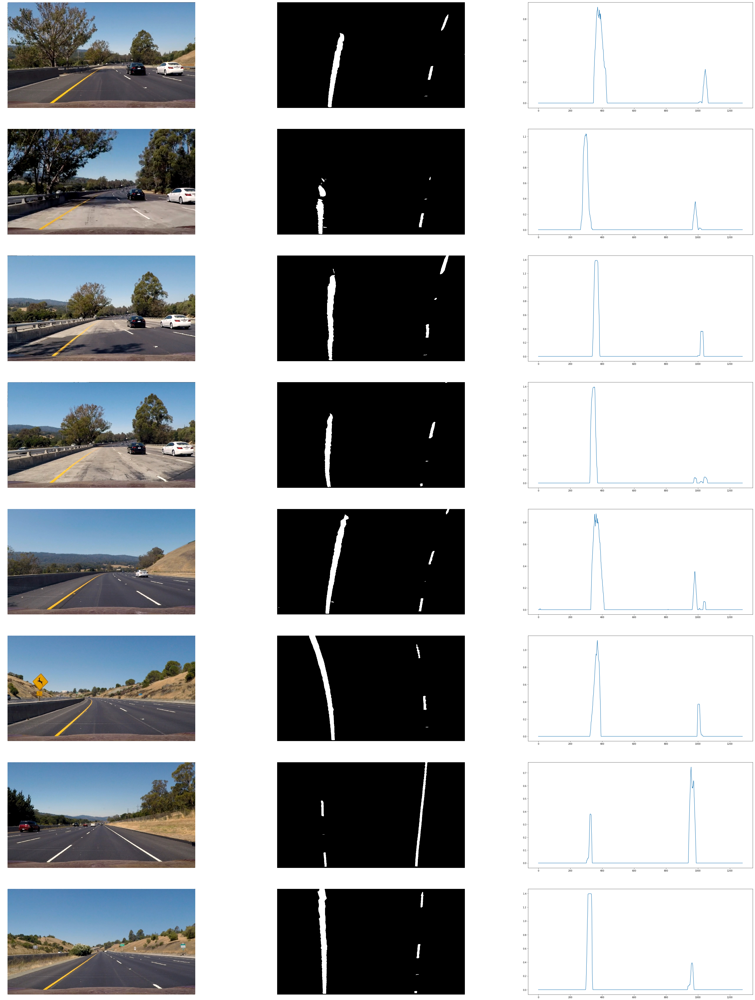

In [299]:
fig, axs = plt.subplots(len(ALL_TEST_IMAGES),3, figsize=(60, 80))
#fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
index = 0
for image in ALL_TEST_IMAGES:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_bin, _ = pipeline(img)
    axs[index].imshow(img)
    axs[index].axis('off')
    index += 1
    axs[index].imshow(img_bin.astype(np.uint8), cmap='gray')
    axs[index].axis('off')
    index += 1
    axs[index].plot(hist(img_bin/255),)
    index += 1

## Implement Sliding Windows and Fit a Polynomial

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'poly Image')

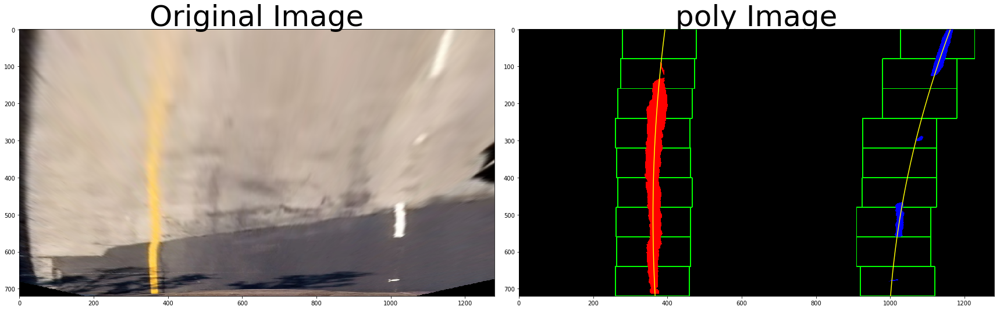

In [399]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img, left_fitx, right_fitx, ploty


tr_img, _ = pipeline(TEST_CAR)
out_img, left_fitx, right_fitx, ploty = fit_polynomial(tr_img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
ax2.imshow(out_img, cmap='gray')
ax2.set_title('poly Image', fontsize=50)


In [339]:
## Skip the sliding windows step once you've found the lines

Text(0.5, 1.0, 'poly Image')

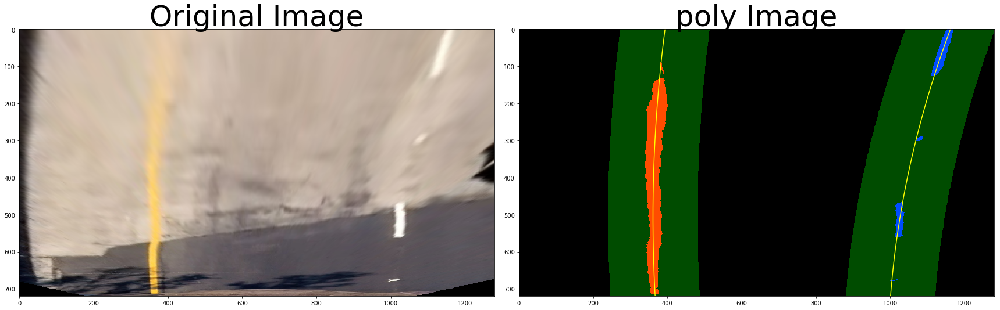

In [416]:
# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 120

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ## End visualization steps ##
    
    return result, left_fitx, right_fitx, ploty, (leftx, lefty, rightx, righty)

tr_img, _ = pipeline(TEST_CAR)
out_img, left_fitx, right_fitx, ploty, param = search_around_poly(tr_img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(TEST_CAR_WARP)
ax1.set_title('Original Image', fontsize=50)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
ax2.imshow(out_img.astype(np.uint8), cmap='gray')
ax2.set_title('poly Image', fontsize=50)

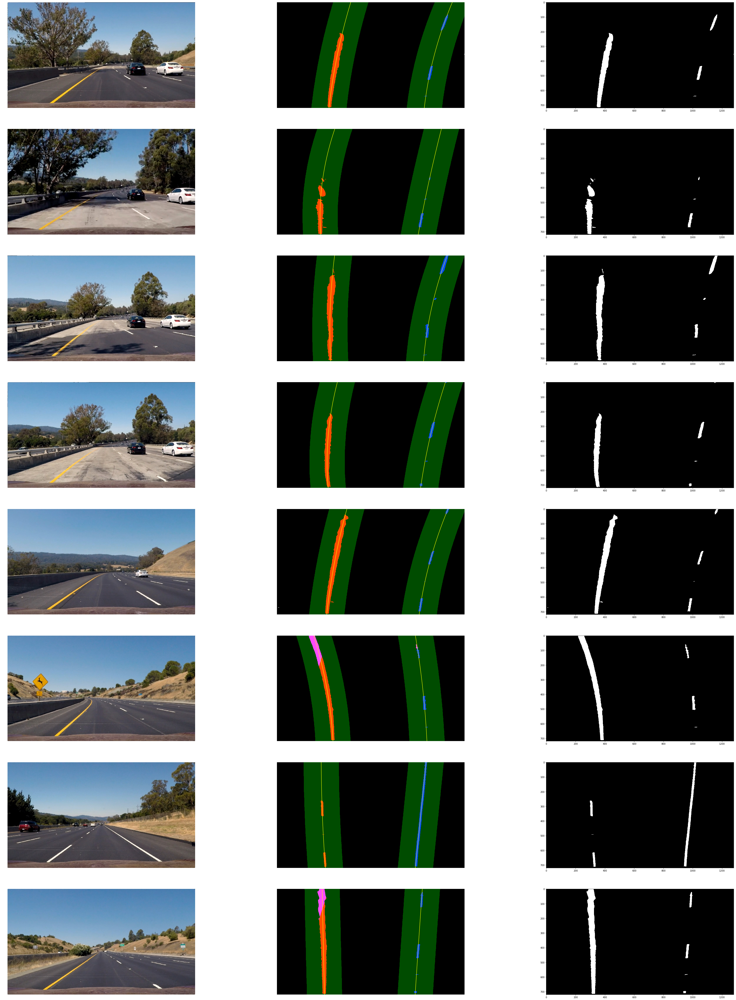

In [415]:
fig, axs = plt.subplots(len(ALL_TEST_IMAGES),3, figsize=(60, 80))
axs = axs.ravel()
                  
index = 0
for image in ALL_TEST_IMAGES:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_bin, _ = pipeline(img)
    out_img, left_fitx, right_fitx, ploty, _, = search_around_poly(img_bin)
    axs[index].imshow(img)
    axs[index].axis('off')
    index += 1
    axs[index].plot(left_fitx, ploty, color='yellow')
    axs[index].plot(right_fitx, ploty, color='yellow')
    axs[index].imshow(out_img.astype(np.uint8), cmap='gray')
    axs[index].axis('off')
    index += 1
    axs[index].imshow(img_bin, cmap='gray')
    index += 1

## Radius of Curvature and Distance from Lane Center Calculation

In [435]:
def curvature_center(img, leftx, lefty, rightx, righty, ploty):
    """
    this function computes the curvature radii of the lanes in the unit of meter. 
    
    this function computes how many meters the vehicle deviates from the center of the lane
    (if the vehicle is on the left/right of middle of the lane, then a positive/negative value is returned)
    
    """
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    img_size = img.shape
    
    y_eval = np.max(ploty)
    y_eval_m = y_eval*ym_per_pix # in meter 
    
    # for later use we also fit with a second order polynomial (in the unit of meter)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2) 
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_m + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_m + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # find the mid point of the lane at the bottom of the image 
    left_lane_p = left_fit_cr[0]*(y_eval_m)**2 + left_fit_cr[1]*(y_eval_m) + left_fit_cr[2]
    right_lane_p = right_fit_cr[0]*(y_eval_m)**2 + right_fit_cr[1]*(y_eval_m) + right_fit_cr[2] 
    mid_lane_p = (left_lane_p + right_lane_p)/2.0
    # deviation from the center of the vehicle (located at the center of the image in x-direction)
    center = mid_lane_p - xm_per_pix*img_size[0]/2.0
    
    return left_curverad, right_curverad, center

In [439]:
for image in ALL_TEST_IMAGES:
    img = mpimg.imread(image)
    img_bin, _ = pipeline(img)
    out_img, left_fitx, right_fitx, ploty, param = search_around_poly(img_bin)
    left_curverad, right_curverad, center_dist = curvature_dev_center(out_img, *param, ploty)
    print('-=======', image)
    print('Radius of curvature for example:', left_curverad, 'm,', right_curverad, 'm')
    print('Distance from lane center for example:', center_dist, 'm')

-======= ./test_images/test6.jpg
Radius of curvature for example: 1240.193928279826 m, 777.8188281905927 m
Distance from lane center for example: 1.694503583387342 m
-======= ./test_images/test5.jpg
Radius of curvature for example: 575.83601974517 m, 3345.4962559415508 m
Distance from lane center for example: 1.436238766952374 m
-======= ./test_images/test4.jpg
Radius of curvature for example: 1298.9841465007667 m, 804.7548515890168 m
Distance from lane center for example: 1.71214649201392 m
-======= ./test_images/test1.jpg
Radius of curvature for example: 694.3445073778005 m, 1283.8108852034031 m
Distance from lane center for example: 1.6131897730082425 m
-======= ./test_images/test3.jpg
Radius of curvature for example: 1442.0460043044252 m, 837.3517827668926 m
Distance from lane center for example: 1.5616025372970235 m
-======= ./test_images/test2.jpg
Radius of curvature for example: 893.0767479830117 m, 1968.4213795655762 m
Distance from lane center for example: 1.8138789810080622 m

## Draw detected lane

In [418]:
def draw_lane(original_img, binary_img, left_fitx, right_fitx, minv):
    new_img = np.copy(original_img)
    if left_fitx is None or right_fitx is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    # Reconstruct the polynomial
    left_fitx = left_fitx[0]*ploty**2 + left_fitx[1]*ploty + left_fitx[2]
    right_fitx = right_fitx[0]*ploty**2 + right_fitx[1]*ploty + right_fitx[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    # vstack will join the arrays
    # transpose will change rows in to columns and columns in to rows, flipud will preserve the rows but shuffle the order
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    # vstack is the vertical stack - Stack row wise
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    # hstack is the horizontal stack
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    # Fill the area
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 255))
    #Draw multiple lines (instead of calling CV2 lines each time cv2 polylines is convinient here)
    # Draw the left lane line
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255, 0, 255), thickness=15)
    # Draw the right lane line
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255, 0, 255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result


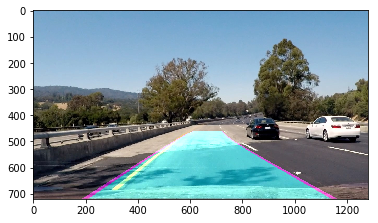

In [419]:
TEST_CAR_DRAW, MINV = pipeline(TEST_CAR)
example_draw = draw_lane(TEST_CAR, TEST_CAR_DRAW, left_fit, right_fit, MINV)
plt.imshow(example_draw)
plt.imsave("output_images/example_draw.jpg", example_draw)

In [420]:
def draw(original_img, curv_rad, center_dist):
    #copy of the image
    new_img = np.copy(original_img)
    # get the height
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    #putText function does the magic
    cv2.putText(new_img, text, (40,70), font, 2.0, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    # put this text just below the above information
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 2.0, (200,255,155), 2, cv2.LINE_AA)
    return new_img

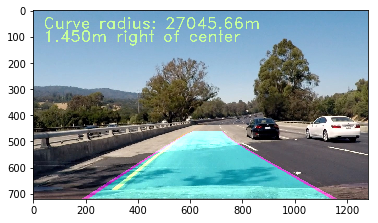

In [423]:
img = mpimg.imread(image)
img_bin, _ = pipeline(img)
out_img, left_fitx, right_fitx, ploty, param = search_around_poly(img_bin)
left_curverad, right_curverad, center_dist = curvature_dev_center(out_img, *param, ploty)
example_draw_center = draw(example_draw, (left_curverad+right_curverad)/2.0, center_dist)
plt.imshow(example_draw_center)
plt.imsave("output_images/example_draw_center.jpg", example_draw_center)